In [1]:
'''
Author: David Brin
Date Created: 1/20/2025

This notebook is to rerun stats and plots from the primate spike dataset by groups
where each group is created by fixing all but one relevant parameter to explain what parameters result in significant results.
'''

'\nAuthor: David Brin\nDate Created: 1/20/2025\n\nThis notebook is to rerun stats and plots from the primate spike dataset by groups\nwhere each group is created by fixing all but one relevant parameter to explain what parameters result in significant results.\n'

## Imports

In [2]:
#imports
#  taken from 'stats_from_allMonkey_filt'  --> unused imports
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append(r'..\..\..\spikeparam')

from spikeparam.patch.fit import Spike
from spikeparam.patch.fit import SpikeGroup

from neurodsp import spectral

from scipy import signal
import scipy

import h5py
from tqdm import tqdm

import numpy as np
import pandas as pd

from neurodsp import filt
from neurodsp.timefrequency import amp_by_time, phase_by_time
from neurodsp.plts import plot_time_series, plot_instantaneous_measure
from neurodsp.plts.time_series import plot_bursts
from neurodsp.burst import detect_bursts_dual_threshold, compute_burst_stats

from scipy.signal import sosfiltfilt, butter

from scipy.signal import find_peaks
from scipy.optimize import curve_fit
from scipy.stats import pearsonr
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import scipy.spatial as sp_spatial
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd


import os

from fooof import FOOOF

sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})

import IProgress

import openpyxl
import glob

import pickle

C:\Users\david\AppData\Local\Temp\ipykernel_33164\2694937235.py:48: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


## Define functions

In [3]:
# Functions to save a datrame to a pickle file and another to extract the data from the pickle file

def save_dataframe_to_pickle(dataframe, file_path):
    """
    Function to save a DataFrame as a pickle file.
    
    Args:
    - dataframe (pd.DataFrame): DataFrame to be saved.
    - file_path (str): Path to save the pickle file.
    """
    dataframe.to_pickle(file_path)

def load_dataframe_from_pickle(file_path):
    """
    Function to extract a DataFrame from a pickle file.
    
    Args:
    - file_path (str): Path to the pickle file.
    
    Returns:
    - dataframe (pd.DataFrame): Loaded DataFrame.
    """
    dataframe = pd.read_pickle(file_path)
    return dataframe

def save_dict_to_pickle(dictionary, filepath):
    """
    Save a dictionary to a pickle file.

    Parameters:
        dictionary (dict): The dictionary to save.
        filepath (str): The path to the pickle file.
    """
    with open(filepath, 'wb') as f:
        pickle.dump(dictionary, f)
    print(f"Dictionary saved to {filepath}")


def load_dict_from_pickle(filepath):
    """
    Load a dictionary from a pickle file.

    Parameters:
        filepath (str): The path to the pickle file.

    Returns:
        dict: The loaded dictionary.
    """
    with open(filepath, 'rb') as f:
        dictionary = pickle.load(f)
    print(f"Dictionary loaded from {filepath}")
    return dictionary

In [4]:
def create_comparison_groups(df, metadata_cols):
    results = []

    for varying_col in metadata_cols:
        # Columns to keep fixed (all except the varying one)
        fixed_cols = [col for col in metadata_cols if col != varying_col]

        # Group data by fixed metadata columns
        grouped = df.groupby(fixed_cols)
        subcomparison_index = 1

        for group_name, group_data in grouped:
            # Get unique values for the varying column within the fixed group
            varying_groups = group_data[varying_col].unique()

            # Ensure there are at least two values for the varying column
            if len(varying_groups) > 1:
                # Create a single subcomparison that includes all varying groups
                subsets = {value: group_data[group_data[varying_col] == value] for value in varying_groups}
                
                results.append({
                    'Subcomparison': subcomparison_index,
                    'Varying Metadata': varying_col,
                    'Fixed Metadata': ', '.join([f"{col}={val}" for col, val in zip(fixed_cols, group_name)]) if isinstance(group_name, tuple) else f"{fixed_cols[0]}={group_name}",
                    'Groups': {value: len(subset) for value, subset in subsets.items()}
                })

                subcomparison_index += 1

    return pd.DataFrame(results)


In [5]:
def print_ANOVA(df, condition):
    '''
    prints ANOVA results for each feature
    
    params: df- the data frame to look through (for groups)
            condition- the non-fixed metadata variable
    
    returns: nothing, prints results
    '''
    # Define the spike features and conditions
    spike_features = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                           'peak_sharpness', 'exp_lambda', 'exp_const', 'isi', 'r_squared_ramp']
    # Initialize a dictionary to store ANOVA results
    anova_results = {feature: {} for feature in spike_features}
    # Perform ANOVA for each spike feature against each condition
    for feature in spike_features:
        groups = [df[feature][df[condition] == cond] for cond in df[condition].unique()]  #scrutinize
        anova_results[feature][condition] = scipy.stats.f_oneway(*groups)
    # Print the ANOVA results
    for feature, results in anova_results.items():
        print(f"ANOVA results for {feature}:")
        for condition, result in results.items():
            if result:
                f_value, p_value = result
                print(f"  Condition: {condition}, F-value: {f_value}, p-value: {p_value:.10e}")

In [6]:
def print_PostHoc(df, condition):
    '''
    prints PostHoc Tukey results for each feature
    
    params: df- the data frame to look through (for groups)
            condition- the non-fixed metadata variable
    
    returns: nothing, prints results
    '''

    # Define the spike features and conditions
    spike_features = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                      'peak_sharpness', 'exp_lambda', 'exp_const', 'isi', 'r_squared_ramp']
    
    # Initialize a dictionary to store Tukey's test results
    tukey_results = {feature: None for feature in spike_features}
    
    # Perform ANOVA and Tukey's test for each spike feature against the given condition
    for feature in spike_features:
        model_formula = f'{feature} ~ C({condition})'
        model = smf.ols(model_formula, data=df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        
        # If ANOVA shows significant results, perform Tukey's test
        if anova_table["PR(>F)"].iloc[0] < 0.05:
            try:
                tukey = pairwise_tukeyhsd(endog=df[feature].astype(float),
                                          groups=df[condition].astype(str),
                                          alpha=0.05)
                tukey_results[feature] = tukey.summary()
            except Exception as e:
                print(f'Error performing Tukey\'s test for {feature} under {condition}: {e}')

    # Print the Tukey's test results for each feature
    for feature, result in tukey_results.items():
        print(f'Tukey\'s test results for {feature}:')
        if result is not None:
            print(result)
        else:
            print(f'No significant differences found for {feature}.')
        print('\n')

In [7]:
def boxplots_byParam_byGroup(param, df):
    """
    Generates box plots for specific columns in a DataFrame, grouped by a specified parameter.

    This function creates box plots for a predefined list of columns, with the data grouped by the values of the specified parameter. 
    The box plots provide a visual summary of the distribution of the data for each group, highlighting the median, quartiles, and potential outliers.

    Parameters:
    - param (str): The column name in the DataFrame by which to group the data.
        Each unique value in this column will form a separate group in the box plots.
    - df (pandas df): the group to get the data from

    Returns:
    None: The function displays the box plots.
    """
    # Set the style of the plots
    sns.set(style="whitegrid")
    
    # Define the list of columns to plot
    columns_to_plot = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                       'peak_sharpness', 'exp_lambda', 'exp_const', 'isi', 'r_squared_ramp']
    
    # Create box plots for each column controlling for 'brainOrigin'
    for column in columns_to_plot:
        plt.figure(figsize=(10, 6))
        
        sns.boxplot(x=param, y=column, data=df)
        plt.title(f'Box Plot of {column} by {param}')
        plt.xlabel(param)
        plt.ylabel(column)
        plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
        plt.show()



In [21]:
#taken from stats_from_allMonkeyDFs_filt, unedited
def plot_waveform(df, combined_dict_filt, metadata_param = None, median = False, Overlapped = False):
    """
    Plots the average spike waveforms with standard deviation shading.

    This function generates plots of average spike waveforms from a dictionary of spike data. The function can filter
    the data based on a specified metadata parameter and plot the results either separately or overlapped.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing metadata about the spike data.
    - combined_dict_filt (dict): A dictionary where keys are formatted as "{file_name} {Sweep_#}" and values are arrays of spike data.
    - metadata_param (str, optional): The column name in the DataFrame to filter the data by. Each unique value in this column will have its own plot.
    - median (bool, optional): If True, calculates the median spike waveform instead of the mean.
    - Overlapped (bool, optional): If True, plots the average waveforms for all unique values of the metadata parameter on a single plot.
        If False, creates separate plots for each unique value.

    Returns:
    None: The function displays the plots.
    """
    if metadata_param is not None:
        parameters = df[metadata_param].unique()

        if Overlapped: # Create the plot
            plt.figure(figsize=(10, 6))
             # Set the labels and title
            plt.xlabel('Time')
            plt.ylabel('mVs')
            plt.ylim(-80, 55)
            plt.title('Overall Average Spike with Standard Deviation for ' + str(metadata_param))
        for value in parameters:
            # Filter the DataFrame for the current unique value
            param_data = df[df[metadata_param] == value]
            all_spikes = []

            for index, row in param_data.iterrows():
                key = row['Spike_ID']
            
                if key in combined_dict_filt:
                    all_spikes.append(np.array(combined_dict_filt[key]))  # Preserve spike structure
            
            # Convert the list of spike arrays into a 2D NumPy array
            if len(all_spikes) > 0:
                all_spikes_array = np.array(all_spikes, dtype=object)  # Keeps each row variable-length (in case of varying  lengths)
                all_spikes_array = np.vstack(all_spikes)  # Stack into 2D array
            else:
                print(f"No valid spikes found for {metadata_param}")
                continue


            if not Overlapped:
                # Create the plot
                plt.figure(figsize=(10, 6))
                # Set the labels and title
                plt.xlabel('Time')
                plt.ylabel('mVs')
                plt.ylim(-75, 55)
                plt.title('Overall Average Spike with Standard Deviation for ' + str(value))
            # Calculate the average and standard deviation across all spike arrays
            if median:    
                mean_spike = np.median(all_spikes_array, axis=0)
            else:
                mean_spike = np.mean(all_spikes_array, axis=0)
            std_spike = np.std(all_spikes_array, axis=0)
                    
            plt.plot(mean_spike, label=f'Average Spike {metadata_param}:{value}')
            plt.fill_between(range(len(mean_spike)), mean_spike - std_spike, mean_spike + std_spike,
                             alpha=0.2, label='±1 Standard Deviation')
        
            if not Overlapped:    #plots individual graphs
                plt.legend()
                plt.show()

        if Overlapped:           #plots overlapped graphs
            plt.legend()
            plt.show()

    else:                       #creates an average spike graph of all spikes
        all_spikes = []

        # Aggregate all spike arrays from all keys
        for key, spike_data in combined_dict_filt.items():
            all_spikes.append(spike_data)
        
        # Convert the list of all spikes to a numpy array for easier manipulation
        all_spikes_array = np.array(all_spikes)
    
        # Calculate the average and standard deviation across all spike arrays
        mean_spike = np.mean(all_spikes_array, axis=0)
        std_spike = np.std(all_spikes_array, axis=0)
    
        # Create the plot
        plt.figure(figsize=(10, 6))
        plt.plot(mean_spike, label='Average Spike', color='b')
        plt.fill_between(range(len(mean_spike)), mean_spike - std_spike, mean_spike + std_spike, 
                         color='b', alpha=0.2, label='±1 Standard Deviation')
        
        # Set the labels and title
        plt.xlabel('Time')
        plt.ylabel('mVs')
        plt.title('Overall Average Spike with Standard Deviation')
        plt.legend()
    
        # Show the plot
        plt.show()


## Load in Data

In [22]:
allMonkey_df = load_dataframe_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\allMonkey_df_filt.pkl")

In [23]:
allMonkey_df.groupby(['Sweep_#','file_name']).ngroups

2321

In [24]:
combined_dict_filt = load_dict_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\combined_dict_filt.pkl")

Dictionary loaded from C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\combined_dict_filt.pkl


In [12]:
len(combined_dict_filt.keys())

2709

In [13]:
grouping_results_df = load_dataframe_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\groupingResults.pkl")

In [14]:
grouping_results_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29 entries, 0 to 36
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Subcomparison     29 non-null     int64 
 1   Varying Metadata  29 non-null     object
 2   Fixed Metadata    29 non-null     object
 3   Groups            29 non-null     object
dtypes: int64(1), object(3)
memory usage: 1.1+ KB


In [15]:
allMonkey_df.head()

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,...,Spike_#,Spike_ID,file_name,dendriticType,SomaLayerLoc,brainOrigin,Weight,Sex,Age,Species
1,1.832248,0.6,-38.827516,11.984253,0.55,3.929138,5.981717,-53.646425,56.35,0.950116,...,1,M03f0SwSweep_10Sp1,M03_JS_A1_C01,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis
2,1.725643,0.6,-38.571168,11.453247,0.55,3.533936,6.194347,-53.275150,56.20,0.969743,...,2,M03f0SwSweep_10Sp2,M03_JS_A1_C01,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis
3,1.762723,0.6,-39.727784,11.669922,0.60,3.567505,5.819483,-53.277108,NaN,0.975530,...,3,M03f0SwSweep_10Sp3,M03_JS_A1_C01,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis
5,2.058032,0.6,-39.135743,11.889649,0.55,3.807068,6.171128,-52.532920,64.70,0.963031,...,1,M03f0SwSweep_11Sp1,M03_JS_A1_C01,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis
7,2.350725,0.6,-38.891602,11.648560,0.60,3.855896,6.057973,-52.542671,67.35,0.992663,...,3,M03f0SwSweep_11Sp3,M03_JS_A1_C01,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis


In [16]:
sub_dfs = []  # List to store sub dataframes

for _, row in grouping_results_df.iterrows():
    # Extract fixed metadata as a dictionary
    fixed_metadata = {}
    for item in row['Fixed Metadata'].split(", "):
        key, val = item.split("=")
        fixed_metadata[key.strip()] = val.strip()    #whitespice appears to not be the problem
    
    print(f'current: {fixed_metadata}')
    # Filter allMonkey_df_filt for rows matching the fixed metadata
    condition = pd.Series(True, index=allMonkey_df.index)
    for col, val in fixed_metadata.items():
        condition &= allMonkey_df[col] == val

    # Create a sub DataFrame for this group
    sub_df = allMonkey_df[condition]
    if(sub_df.shape[0] == 0):                                          #
        print(f" No match for fixed_metadata!!")
        print("Unique values in allMonkey_df:")
        for col in fixed_metadata:
            print(f"{col}: {allMonkey_df[col].unique()}")
        print(f"\n")
        continue
    sub_dfs.append(sub_df)


display(len(sub_dfs))

current: {'SomaLayerLoc': '2.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
 No match for fixed_metadata!!
Unique values in allMonkey_df:
SomaLayerLoc: [3.0 nan 2.0 4.0 '5_6' '2_3']
brainOrigin: ['PFC' 'IC' 'V1' 'LIP']
Sex: ['F' 'M']
Species: ['Macaca fascicularis' 'Macaca mulatta']


current: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
 No match for fixed_metadata!!
Unique values in allMonkey_df:
SomaLayerLoc: [3.0 nan 2.0 4.0 '5_6' '2_3']
brainOrigin: ['PFC' 'IC' 'V1' 'LIP']
Sex: ['F' 'M']
Species: ['Macaca fascicularis' 'Macaca mulatta']


current: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
 No match for fixed_metadata!!
Unique values in allMonkey_df:
SomaLayerLoc: [3.0 nan 2.0 4.0 '5_6' '2_3']
brainOrigin: ['PFC' 'IC' 'V1' 'LIP']
Sex: ['F' 'M']
Species: ['Macaca fascicularis' 'Macaca mulatta']


current: {'SomaLayerLoc': '3.0', 'brainOrigin': 'V1', 'Sex': 'M', '

11

In [17]:
for _, row in grouping_results_df.iterrows():
    fixed_metadata = dict(item.split("=") for item in row['Fixed Metadata'].split(", "))
    condition = pd.Series(True, index=allMonkey_df.index)
    for col, val in fixed_metadata.items():
        condition &= allMonkey_df[col] == val

    sub_df = allMonkey_df[condition]
    if sub_df.shape[0] == 0:
        print(f"No match for fixed_metadata: {fixed_metadata}")
        continue
    sub_dfs.append(sub_df)


No match for fixed_metadata: {'SomaLayerLoc': '2.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'V1', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'V1', 'Sex': 'M', 'Species': 'Macaca mulatta'}
No match for fixed_metadata: {'SomaLayerLoc': '4.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '4.0', 'brainOrigin': 'PFC', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'dendriticType': 'A', 'SomaLayerLoc': '3.0', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'dendriti

In [18]:
#this method shows the same results as the one(s) above
sub_dfs = []  # List to store sub dataframes

for _, row in grouping_results_df.iterrows():
    # Extract fixed metadata as a dictionary
    fixed_metadata = dict(
        item.split("=") for item in row['Fixed Metadata'].split(", ")
    )
    print(f"Processing Fixed Metadata: {fixed_metadata}")

    # Create a DataFrame from fixed_metadata
    fixed_metadata_df = pd.DataFrame([fixed_metadata])

    # Use pd.merge to filter rows in allMonkey_df
    sub_df = pd.merge(allMonkey_df, fixed_metadata_df, how="inner", on=list(fixed_metadata.keys()))

    if sub_df.empty:
        print(f"No match for fixed_metadata: {fixed_metadata}")
        continue

    # Append the filtered DataFrame
    sub_dfs.append(sub_df)

print(f"Number of sub-dataframes created: {len(sub_dfs)}")


Processing Fixed Metadata: {'SomaLayerLoc': '2.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '2.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
Processing Fixed Metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'F', 'Species': 'Macaca fascicularis'}
Processing Fixed Metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'PFC', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
Processing Fixed Metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'V1', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
No match for fixed_metadata: {'SomaLayerLoc': '3.0', 'brainOrigin': 'V1', 'Sex': 'M', 'Species': 'Macaca fascicularis'}
Processing Fixed Metadata: {'SomaLayerLoc'

In [42]:
sub_dfs_dict = {}  # Dictionary to store sub dataframes
rejected = 0
for _, row in grouping_results_df.iterrows():
    # Extract fixed metadata as a dictionary
    fixed_metadata = {}
    for item in row['Fixed Metadata'].split(", "):
        key, val = item.split("=")
        val = val if "." not in val or not val.replace(".", "", 1).isdigit() else float(val)
        fixed_metadata[key.strip()] = val
        



    varying_metadata_str = row['Varying Metadata']  
    dict_key = f"{varying_metadata_str} {row['Subcomparison']}"

    print(f'Processing: {dict_key}')

    # Filter allMonkey_df for rows matching the fixed metadata
    condition = pd.Series(True, index=allMonkey_df.index)
    for col, val in fixed_metadata.items():
        condition &= allMonkey_df[col] == val

    # Create a sub DataFrame for this group
    sub_df = allMonkey_df[condition]

    if sub_df.shape[0] == 0:  
        print(f" No match for fixed_metadata!!")
        rejected += 1
        print(f"number rejected: {rejected}")
        continue

    # Store sub_df in the dictionary
    sub_dfs_dict[dict_key] = sub_df

display(len(sub_dfs_dict))


Processing: dendriticType 1
Processing: dendriticType 3
Processing: dendriticType 4
Processing: dendriticType 5
Processing: dendriticType 6
Processing: dendriticType 7
Processing: dendriticType 8
Processing: dendriticType 10
Processing: dendriticType 11
Processing: dendriticType 12
Processing: SomaLayerLoc 1
Processing: SomaLayerLoc 2
Processing: SomaLayerLoc 4
Processing: SomaLayerLoc 5
Processing: SomaLayerLoc 6
Processing: SomaLayerLoc 7
Processing: brainOrigin 1
Processing: brainOrigin 4
Processing: brainOrigin 5
Processing: brainOrigin 7
Processing: Sex 1
Processing: Sex 2
Processing: Sex 3
Processing: Sex 4
Processing: Sex 6
Processing: Sex 7
Processing: Sex 8
Processing: Species 1
Processing: Species 3


29

In [43]:
metadata_cols = ['dendriticType', 'SomaLayerLoc', 'brainOrigin', 'Sex', 'Species']

## Plots by Group

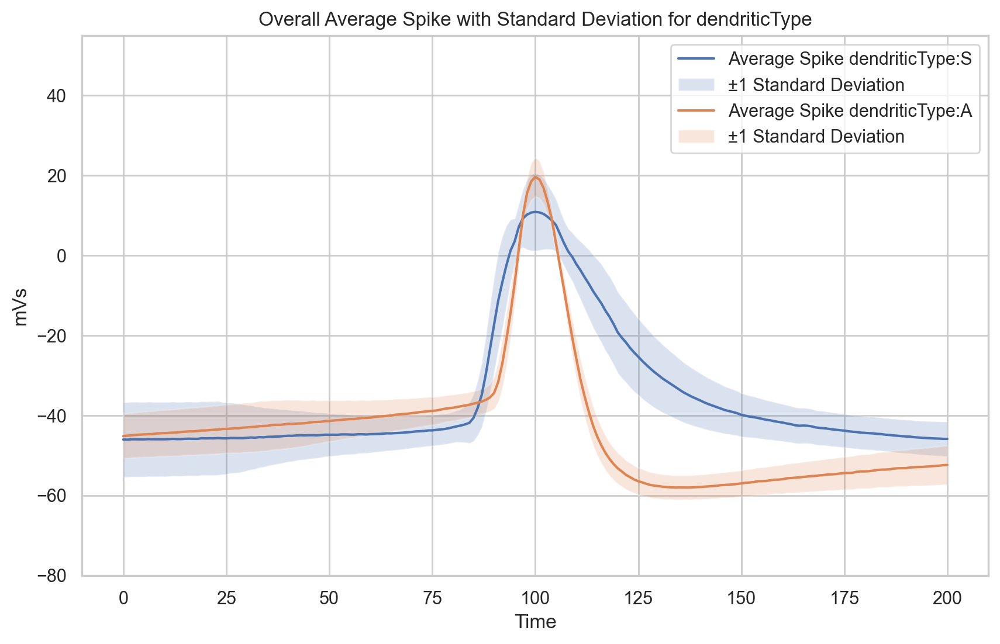

No valid spikes found for dendriticType


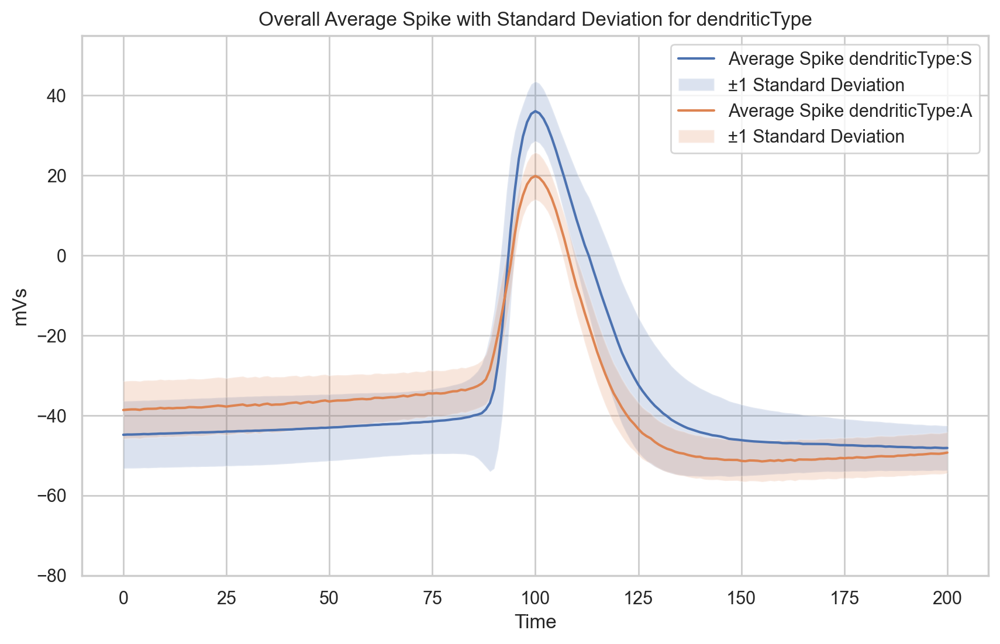

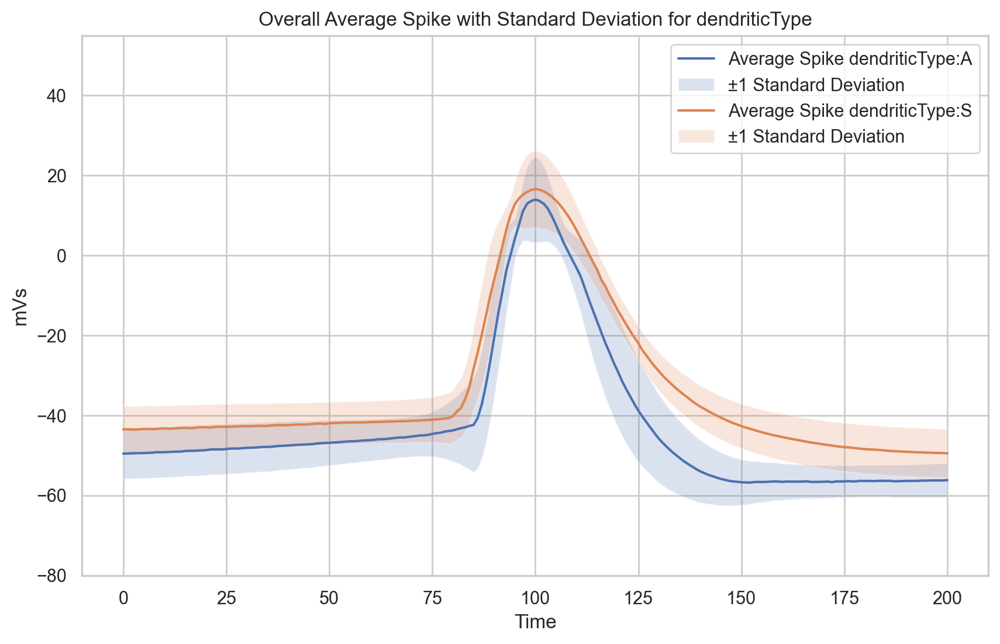

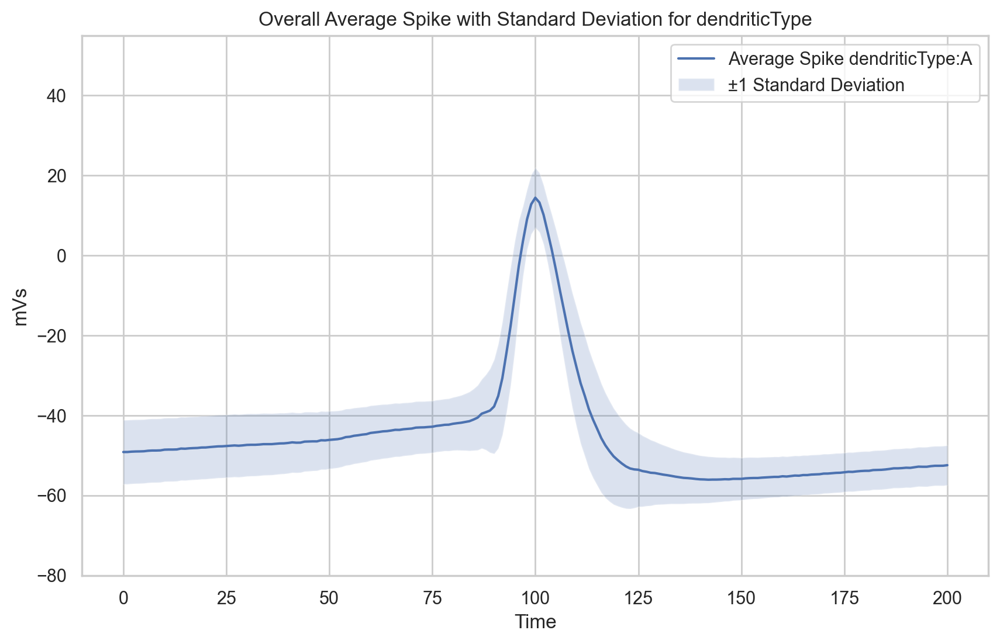

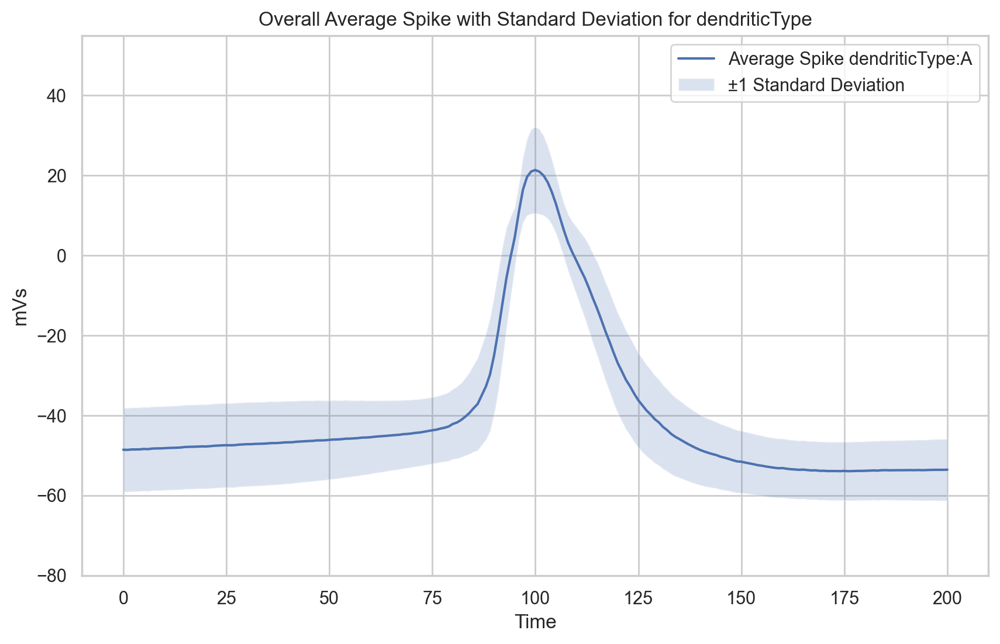

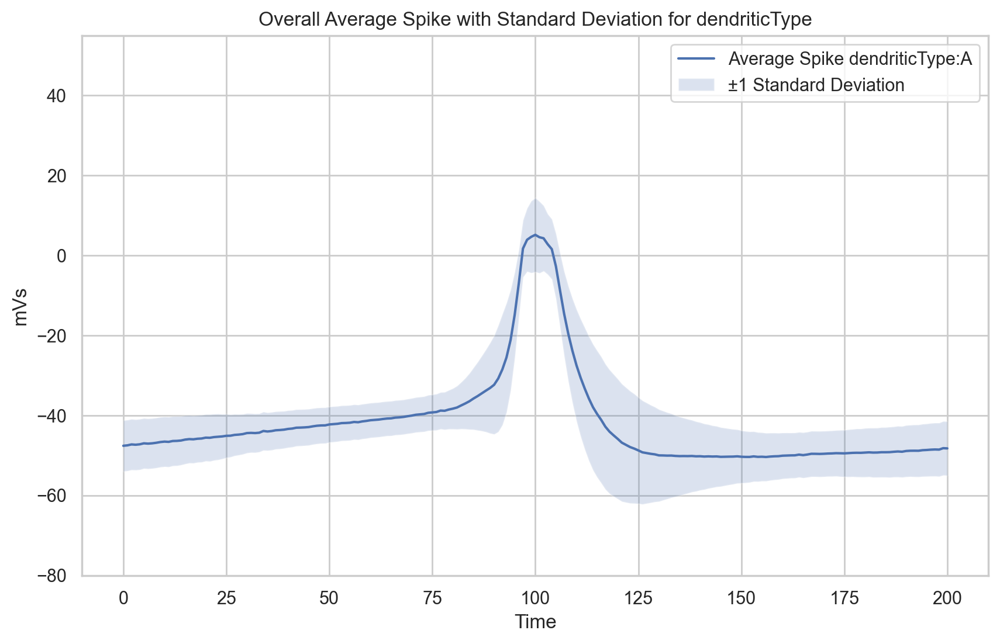

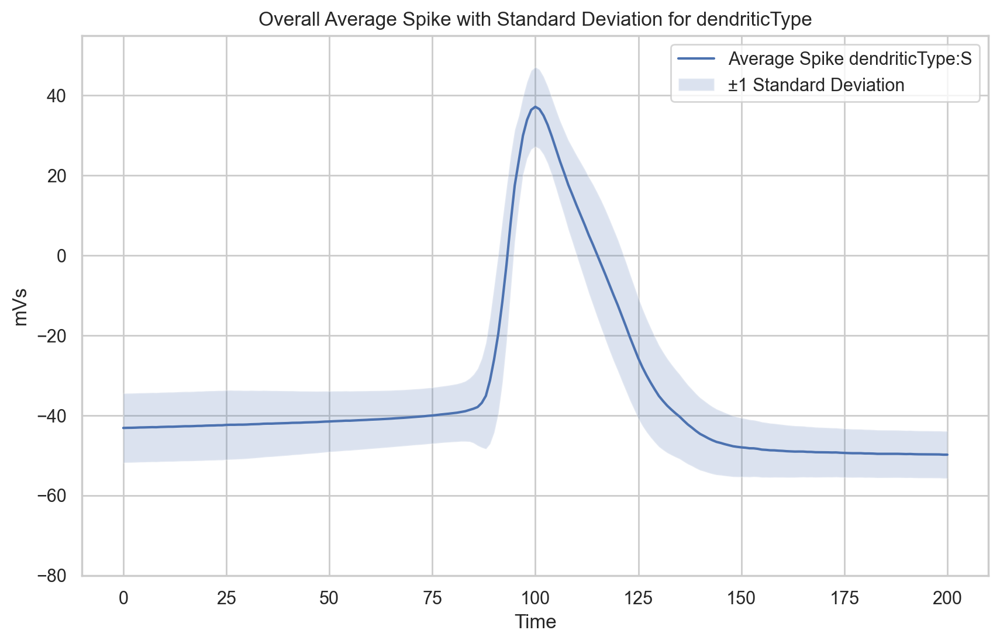

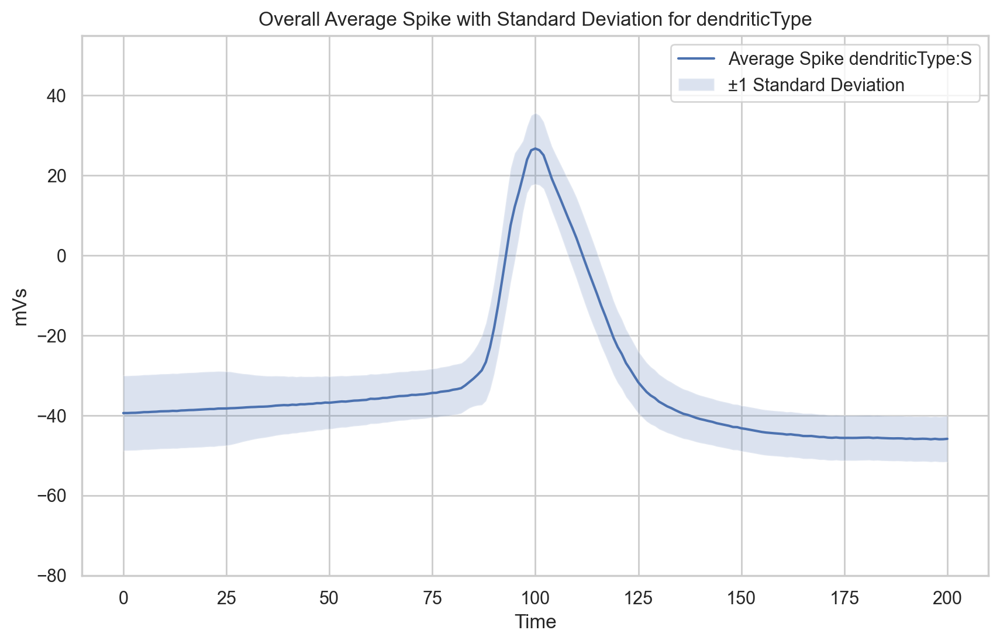

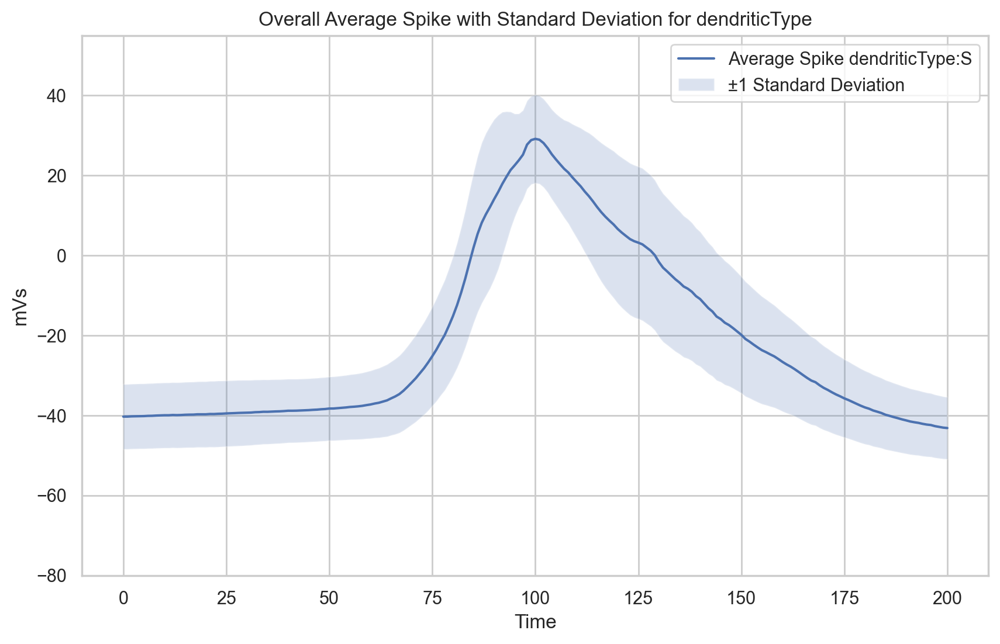

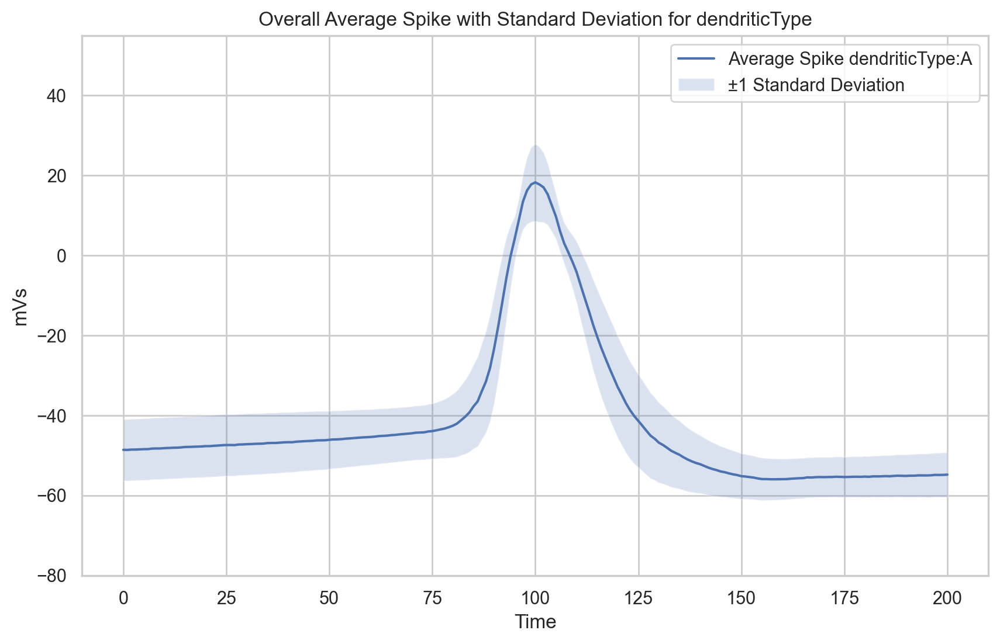

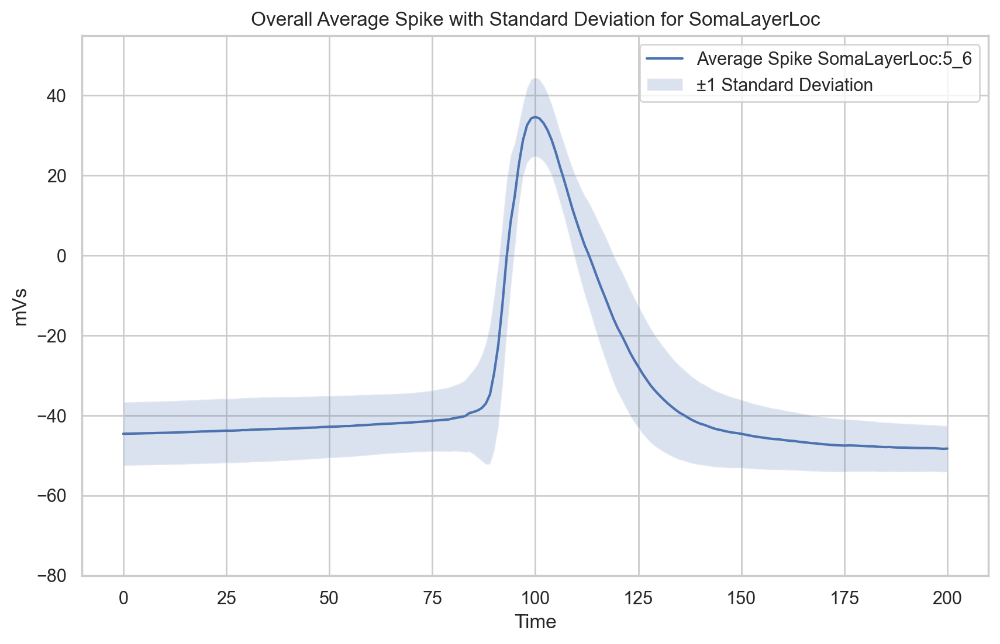

In [44]:
# should add labels
for sub_df, varying_metadata in zip(sub_dfs, grouping_results_df['Varying Metadata']):
    plot_waveform(sub_df, combined_dict_filt, metadata_param = varying_metadata, median = True, Overlapped = True)

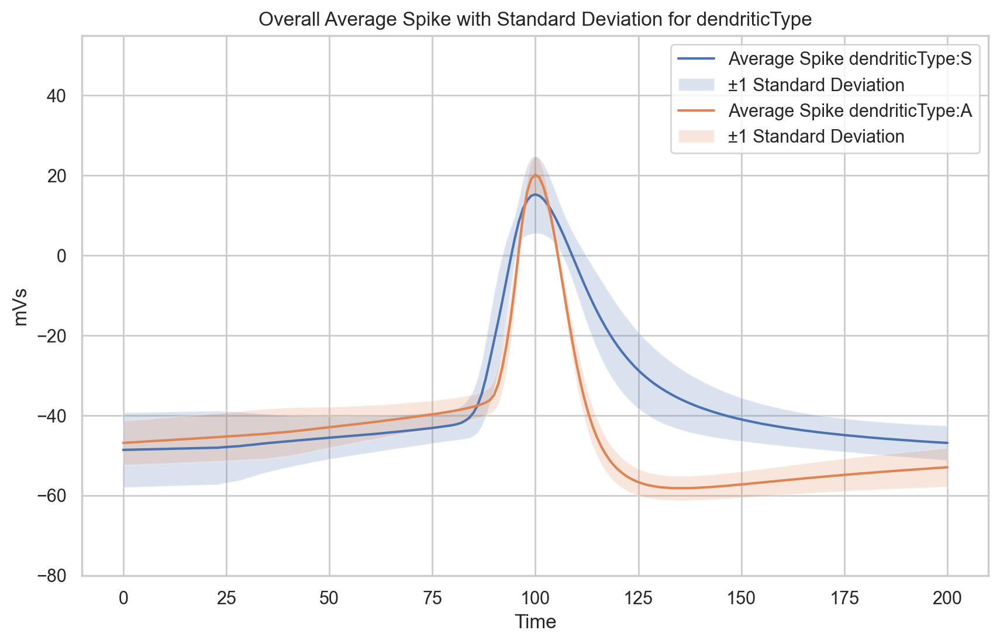

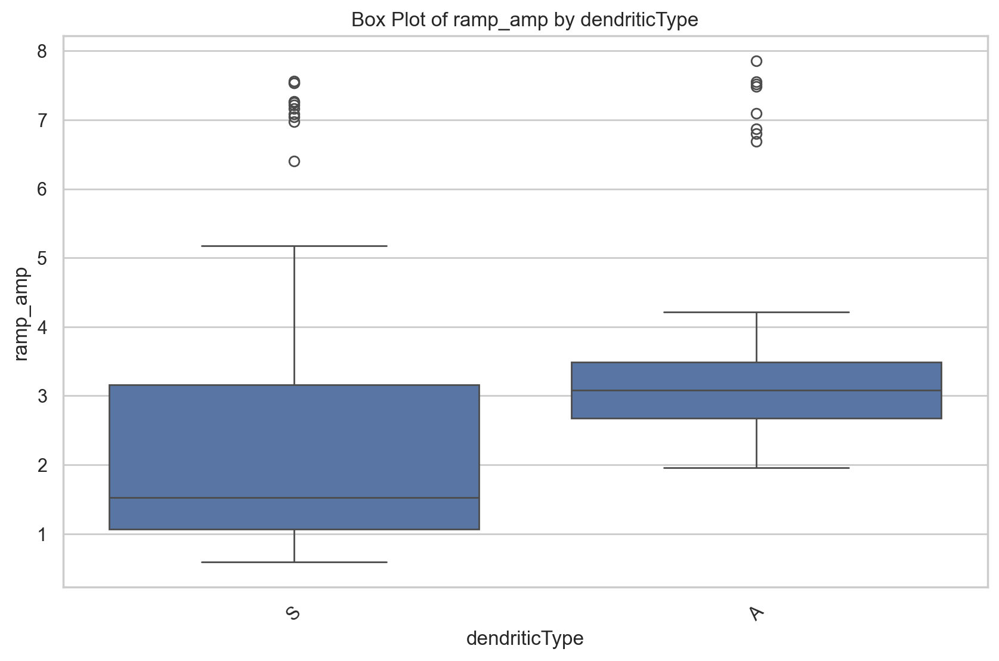

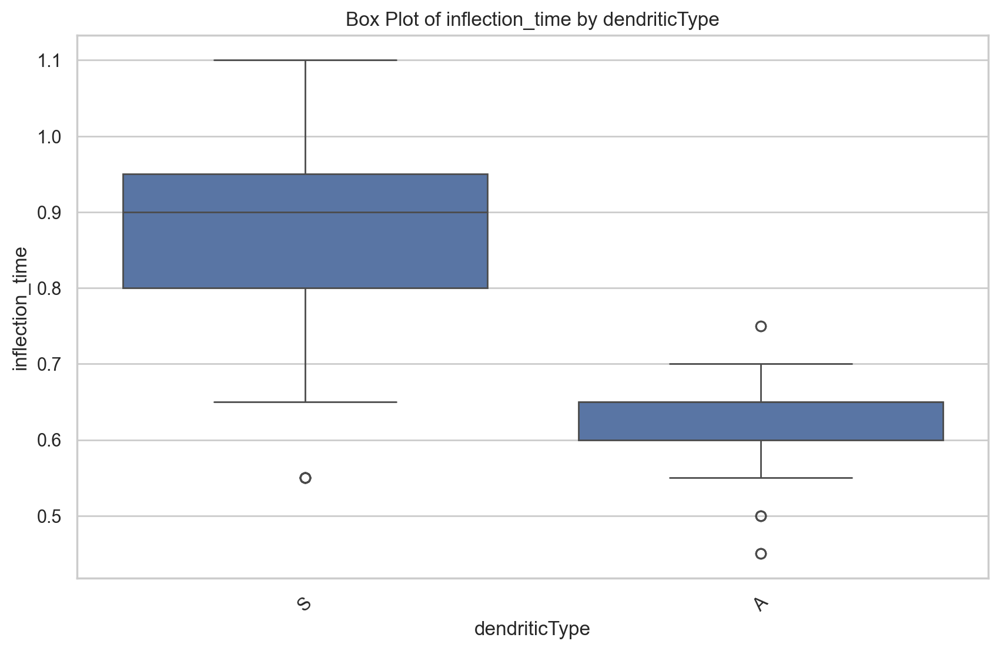

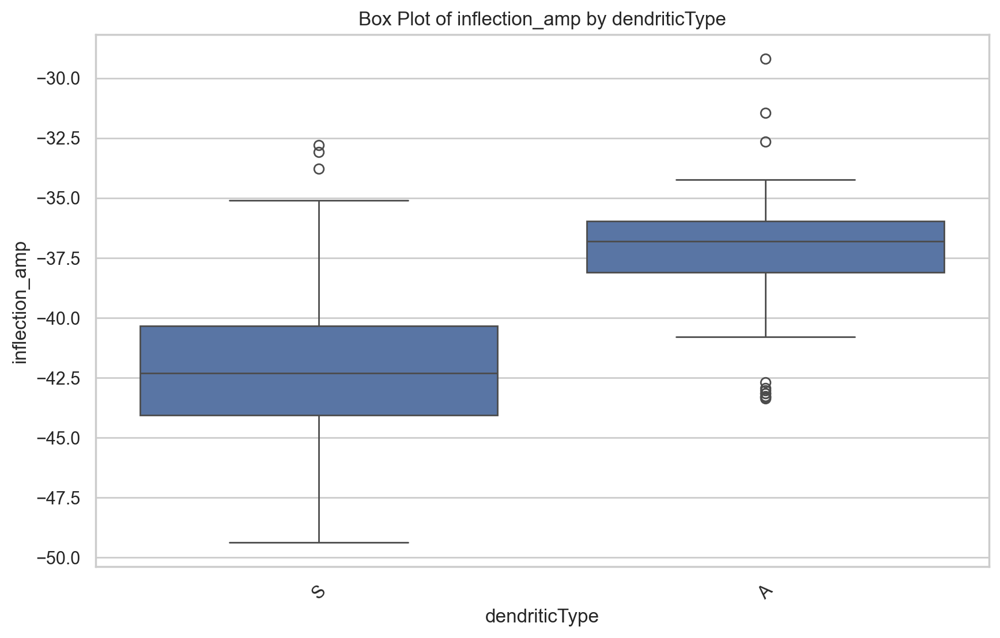

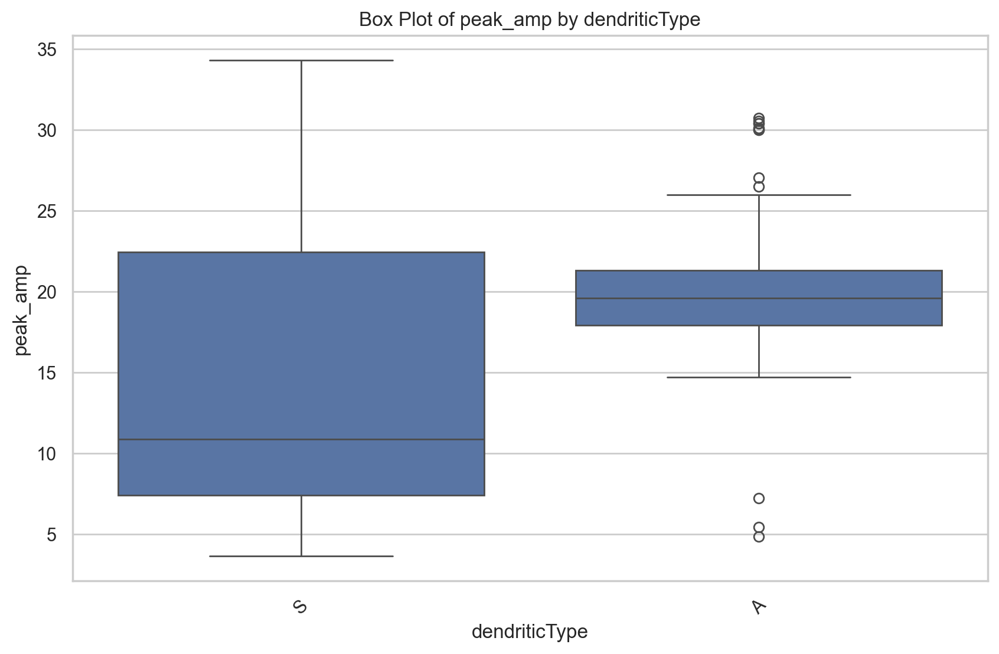

...

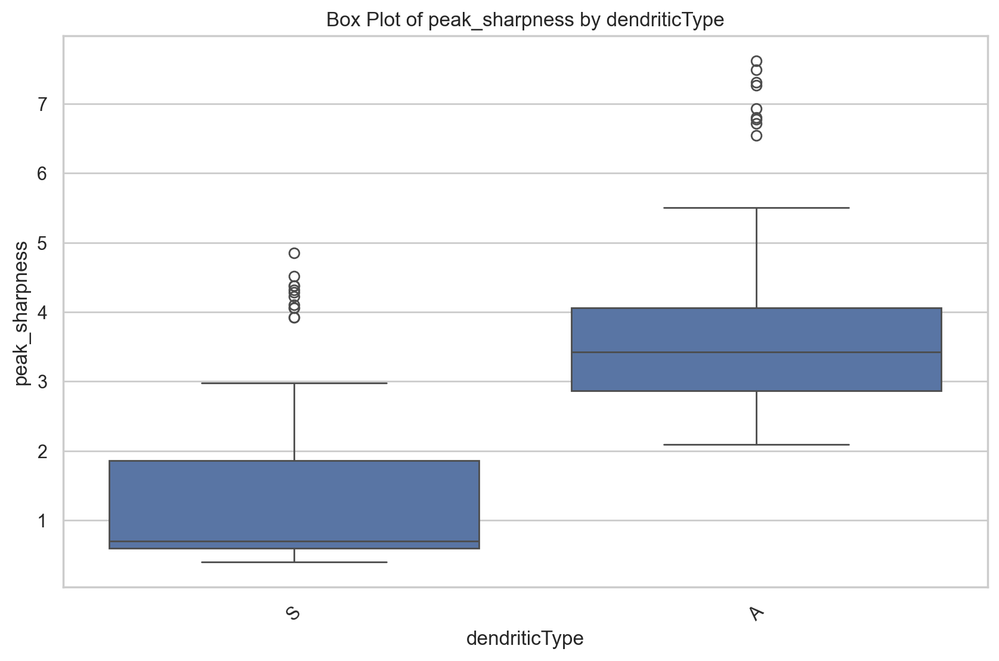

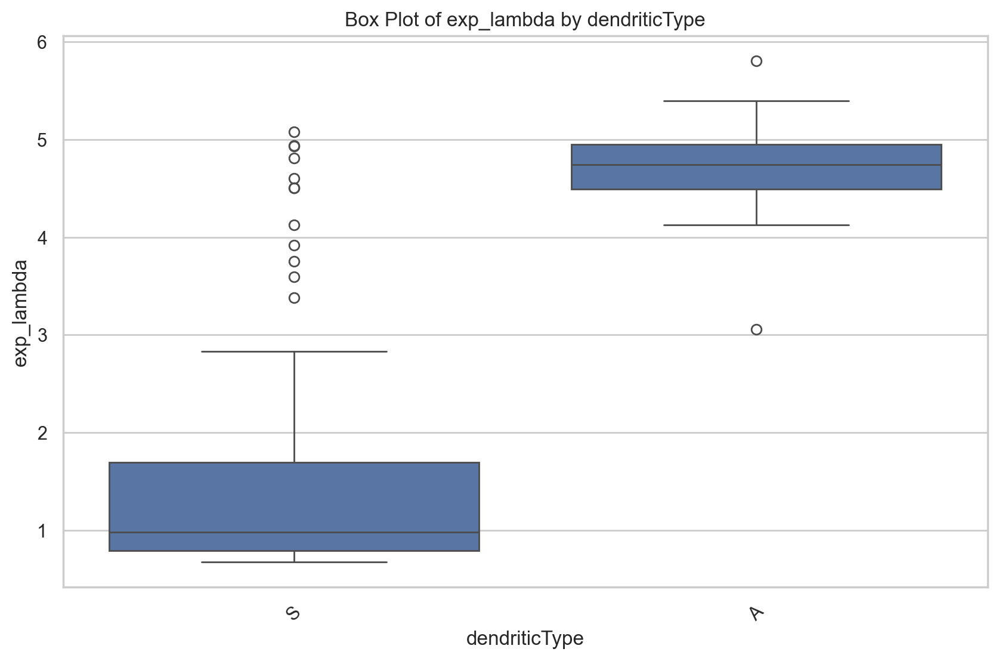

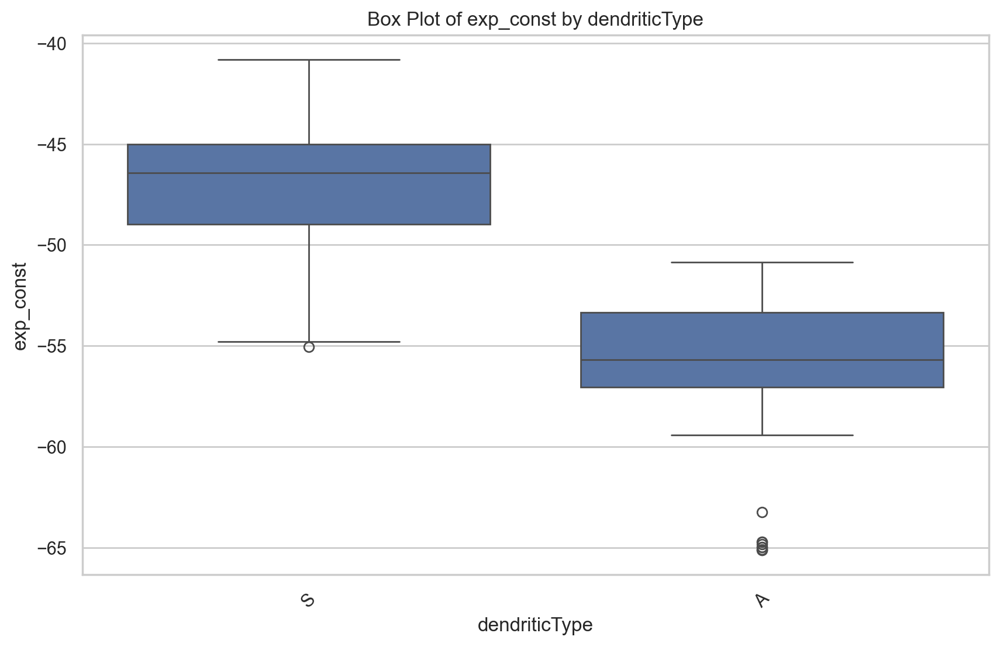

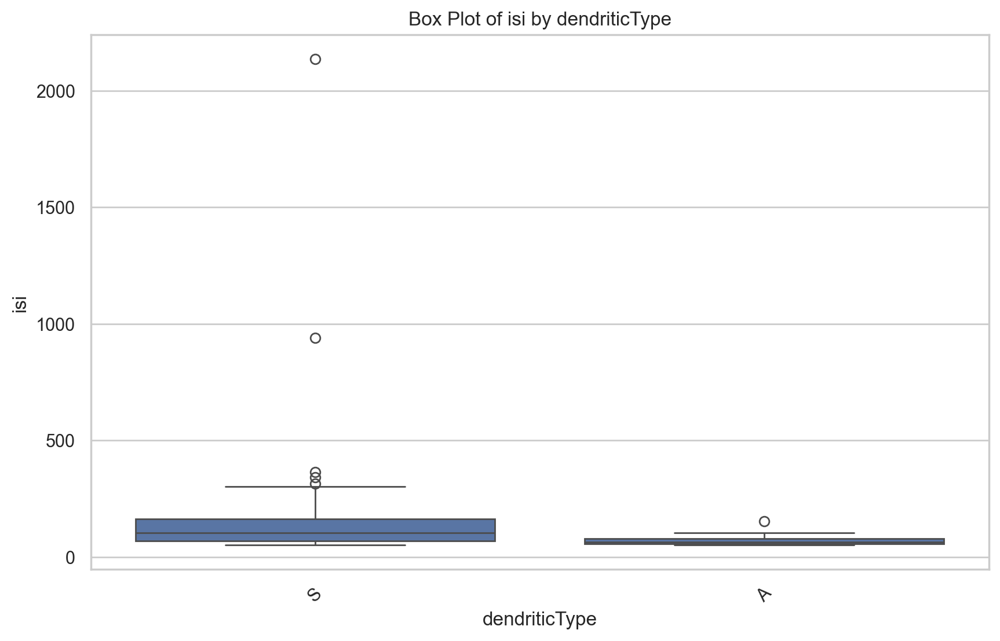

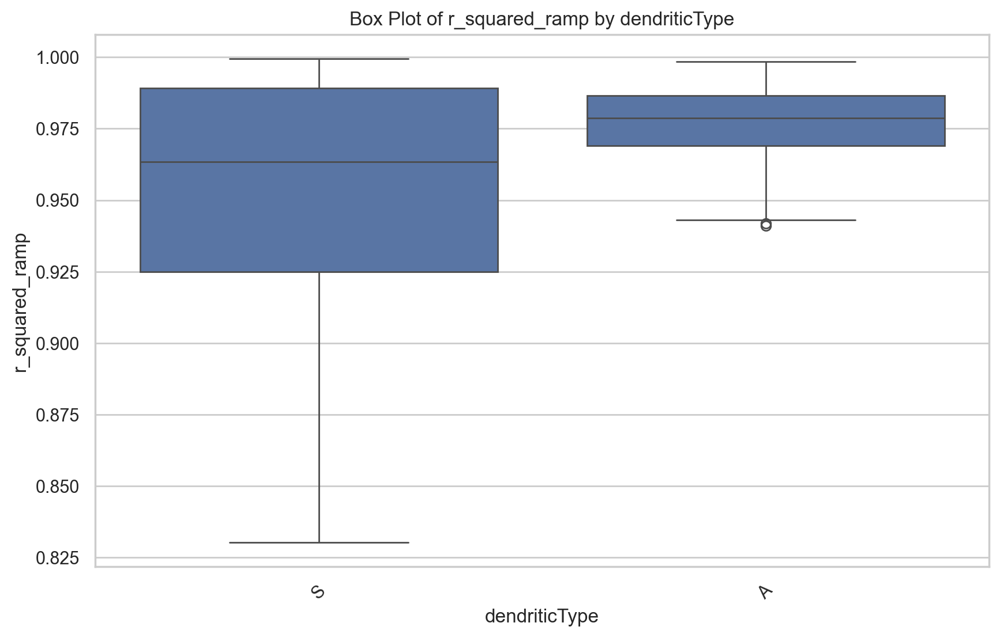

No valid spikes found for dendriticType


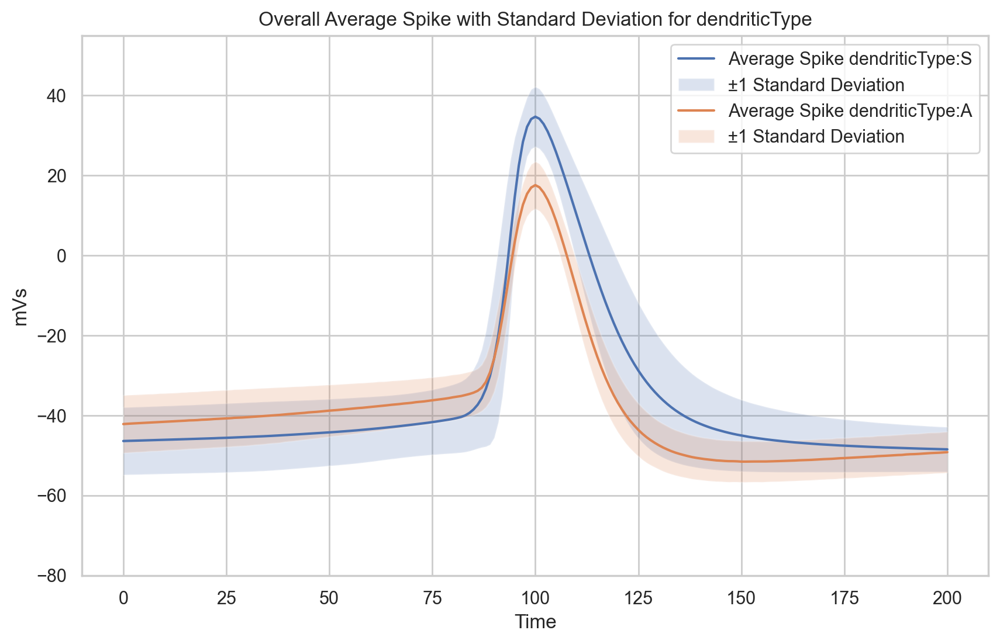

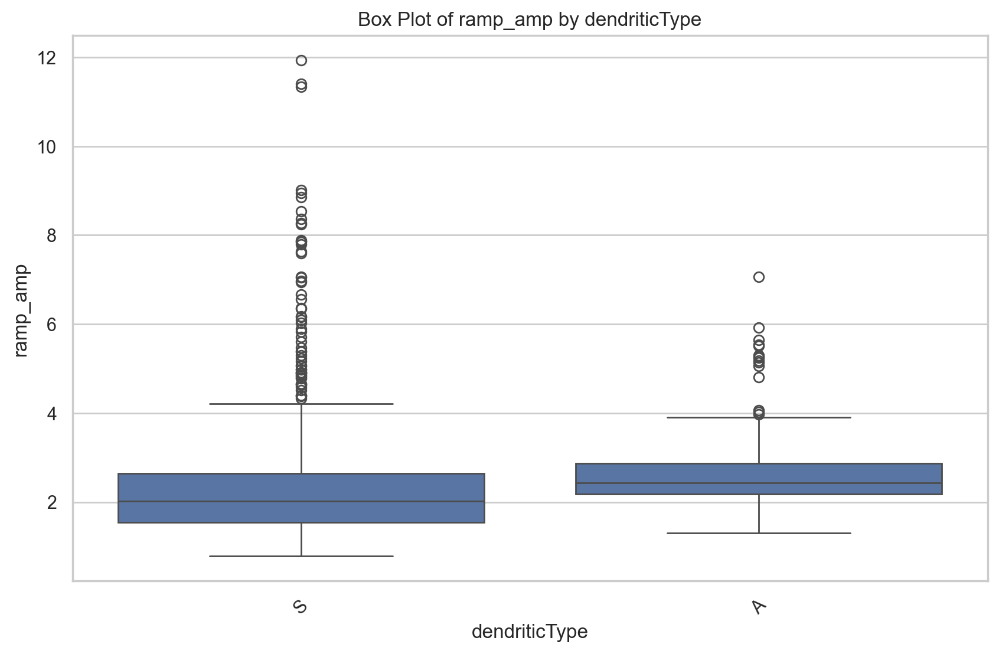

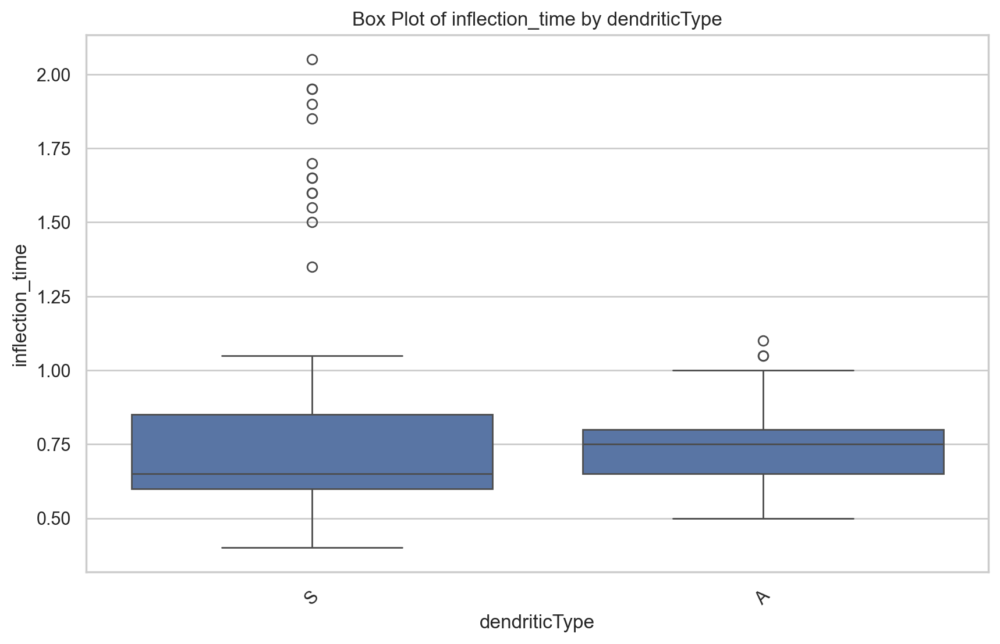

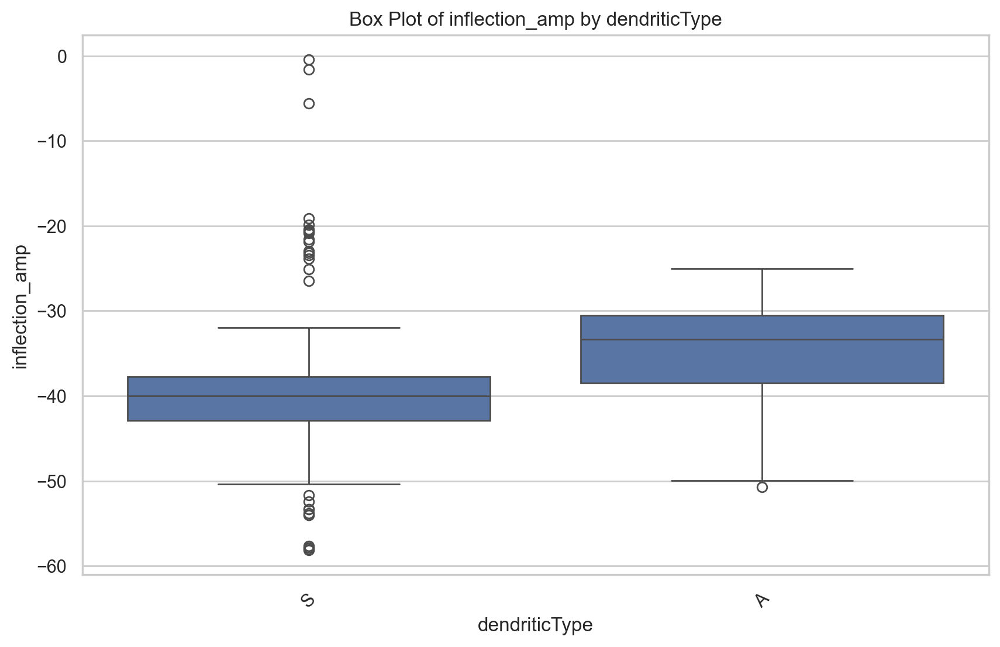

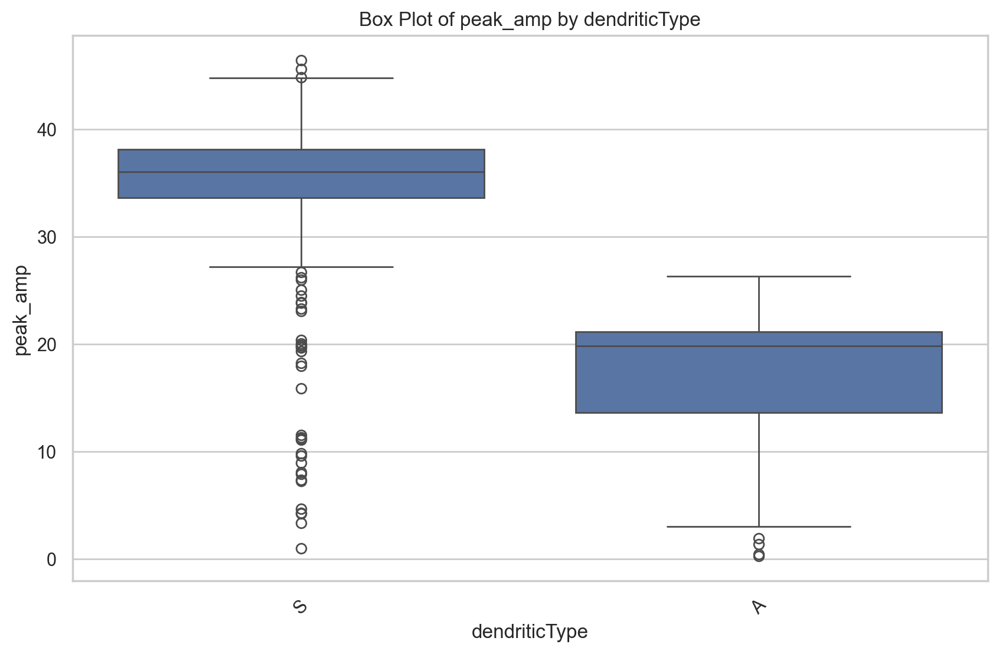

...

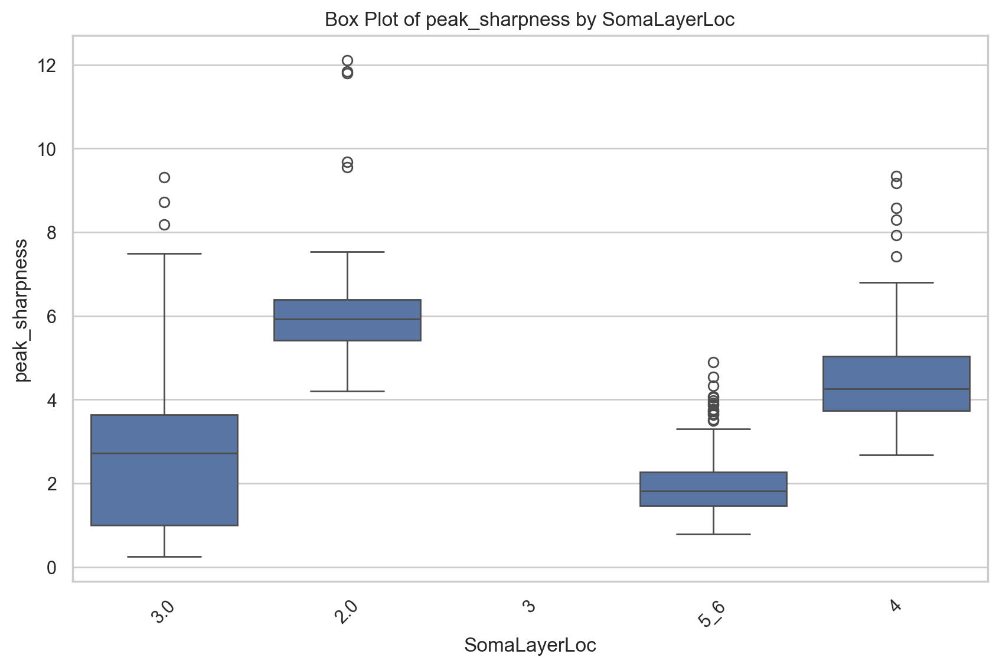

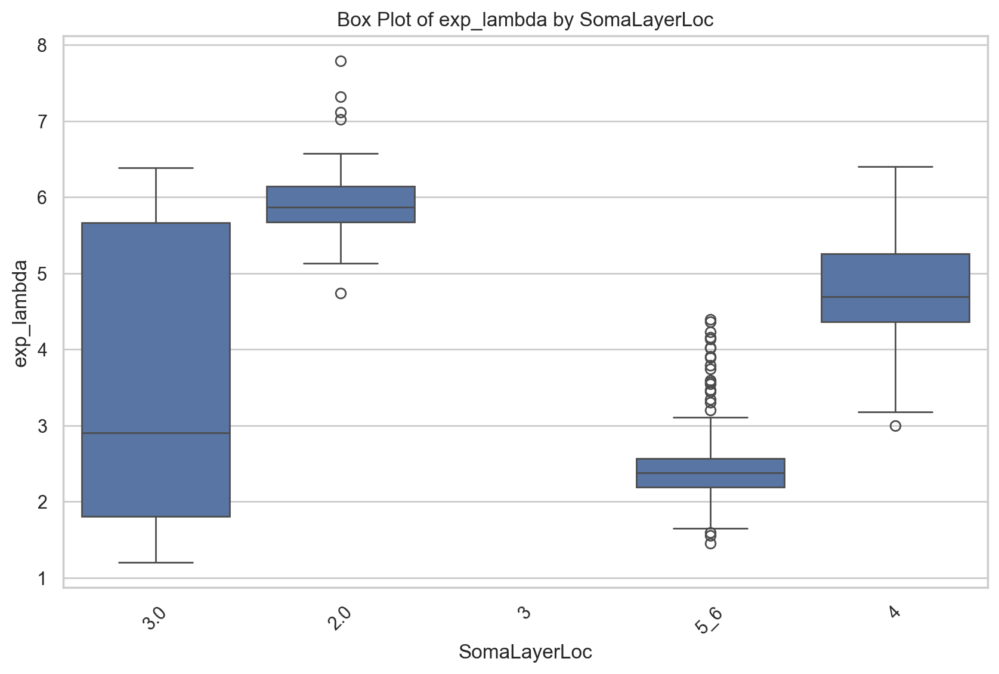

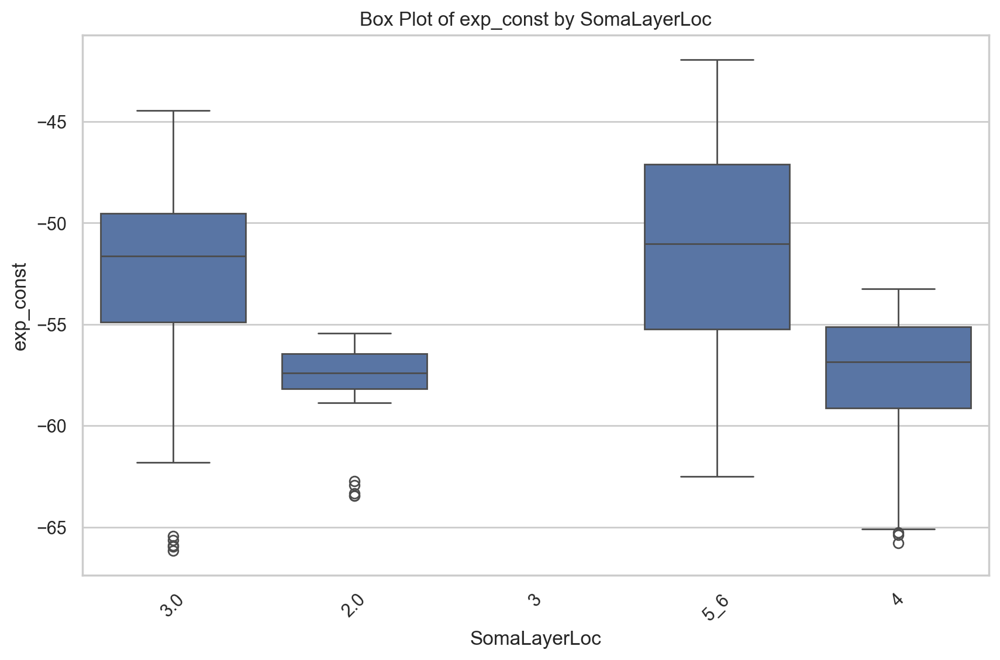

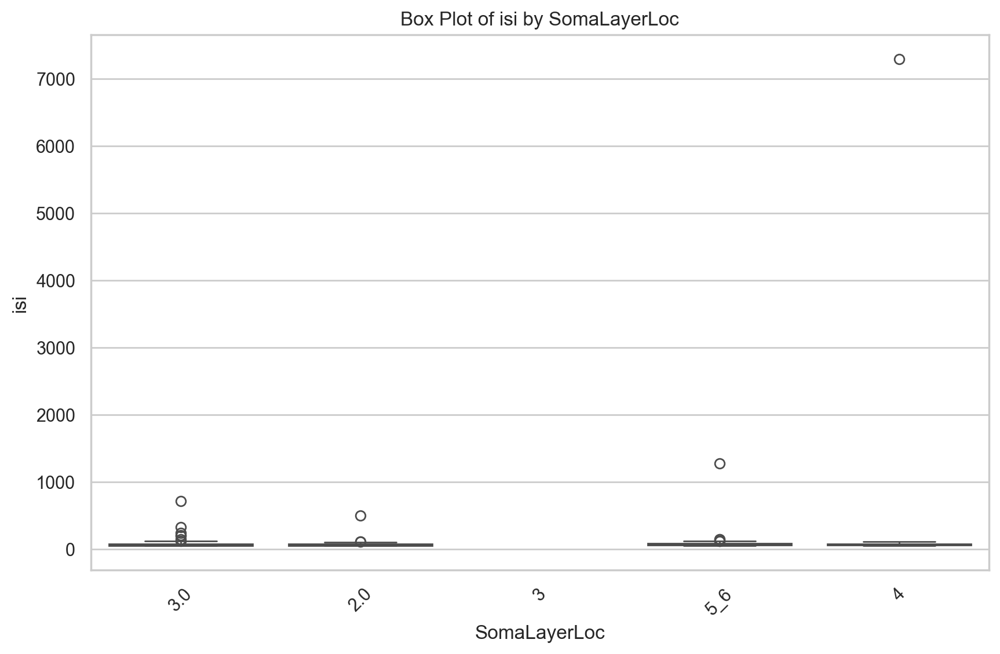

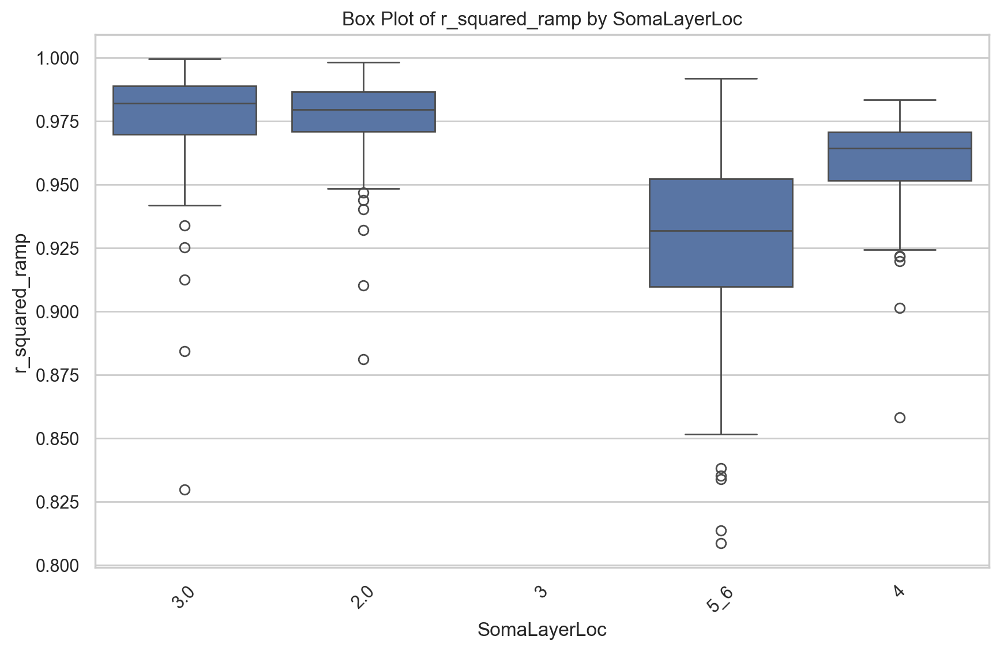

No valid spikes found for SomaLayerLoc


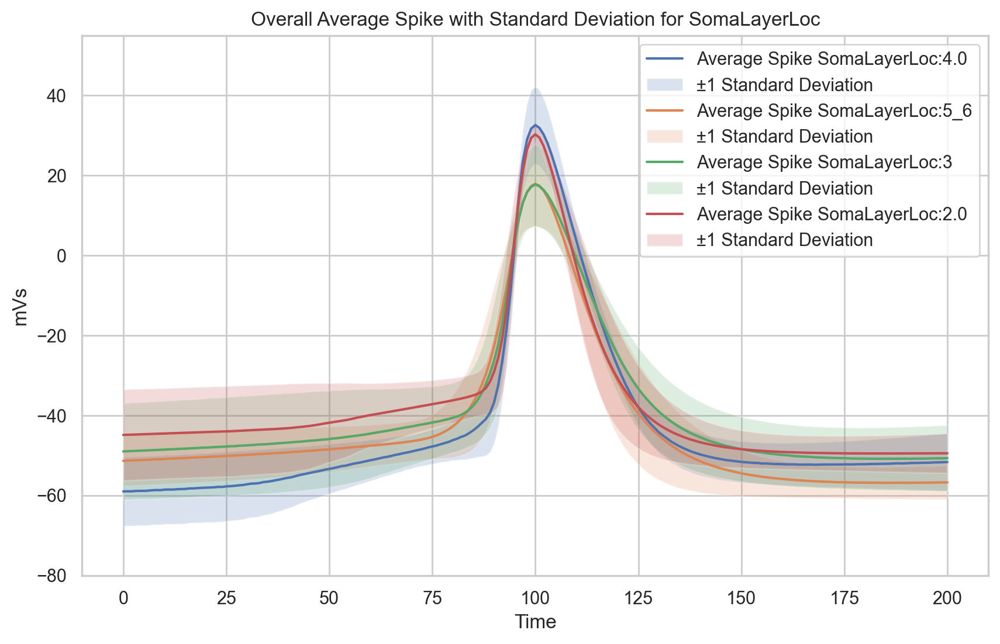

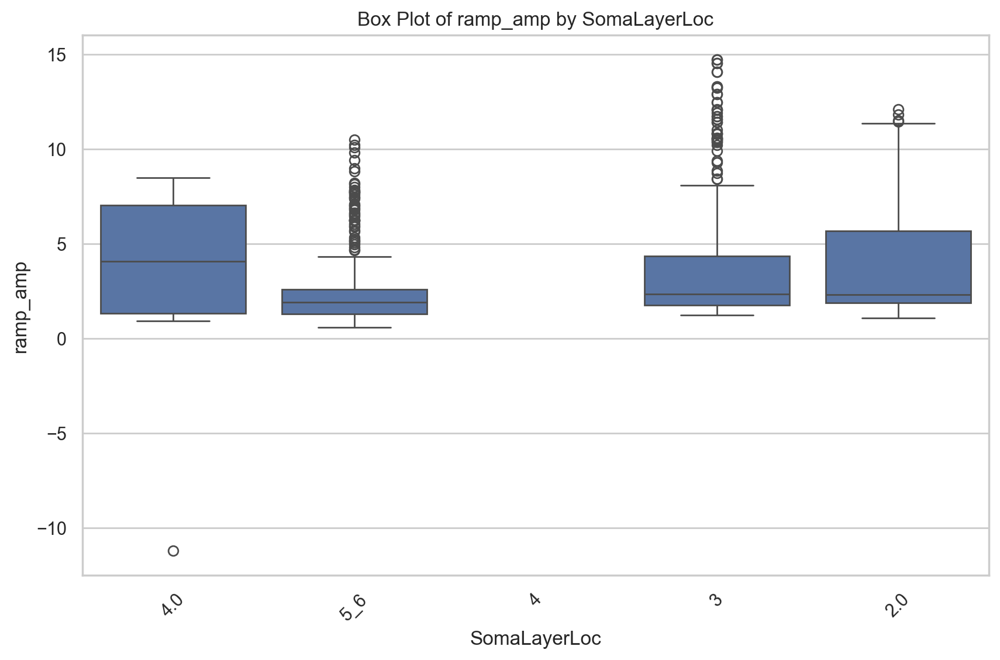

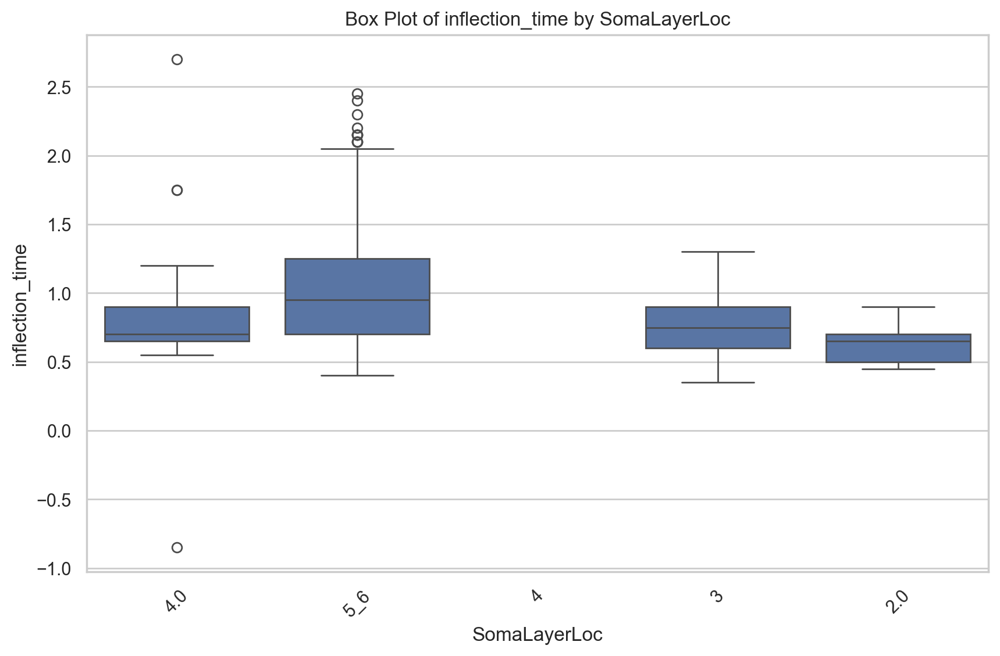

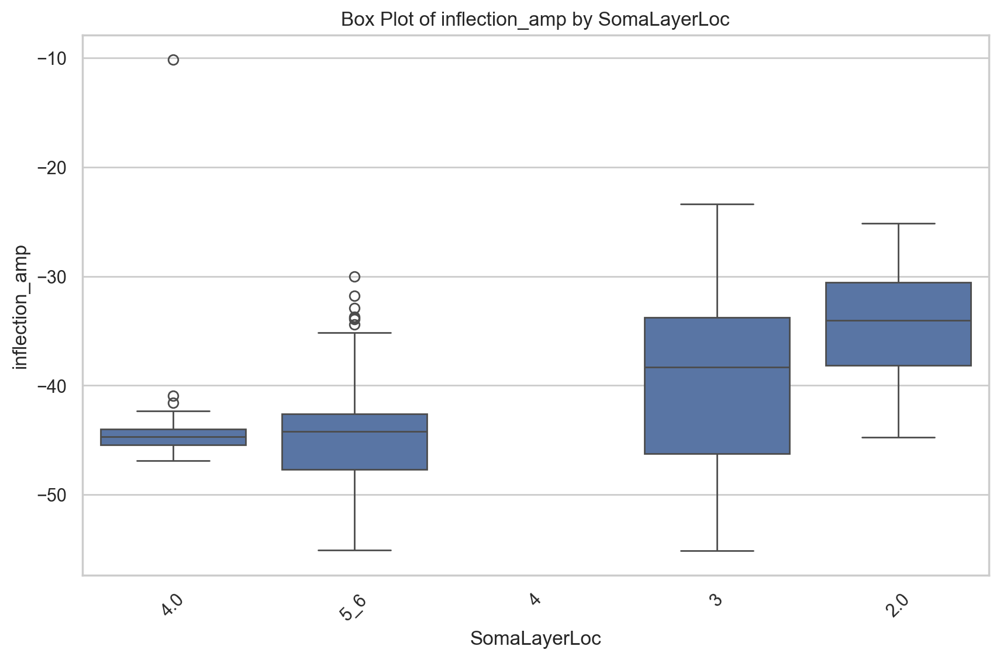

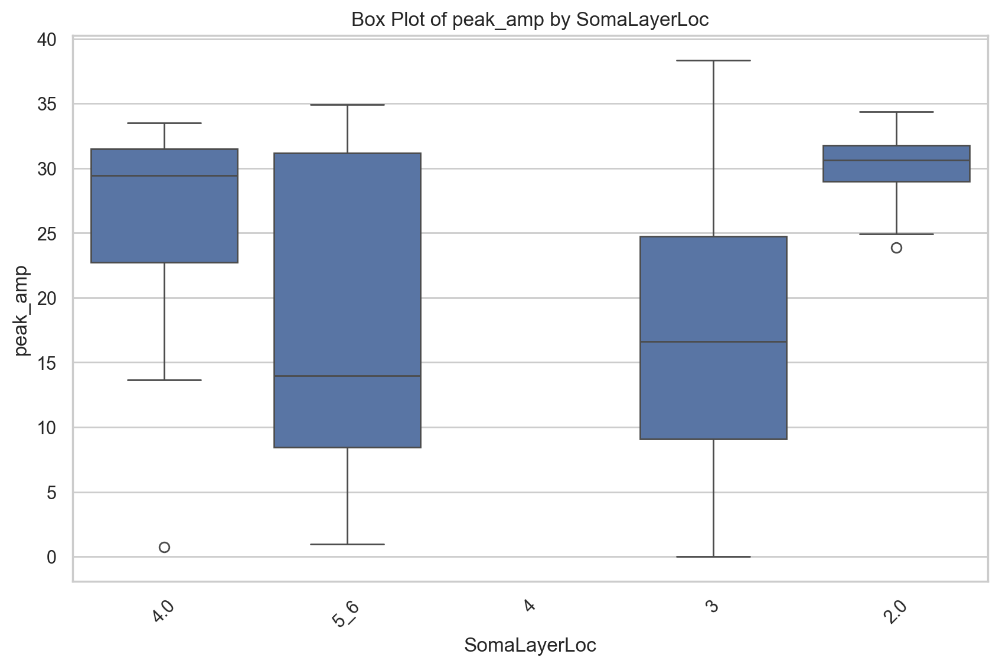

...

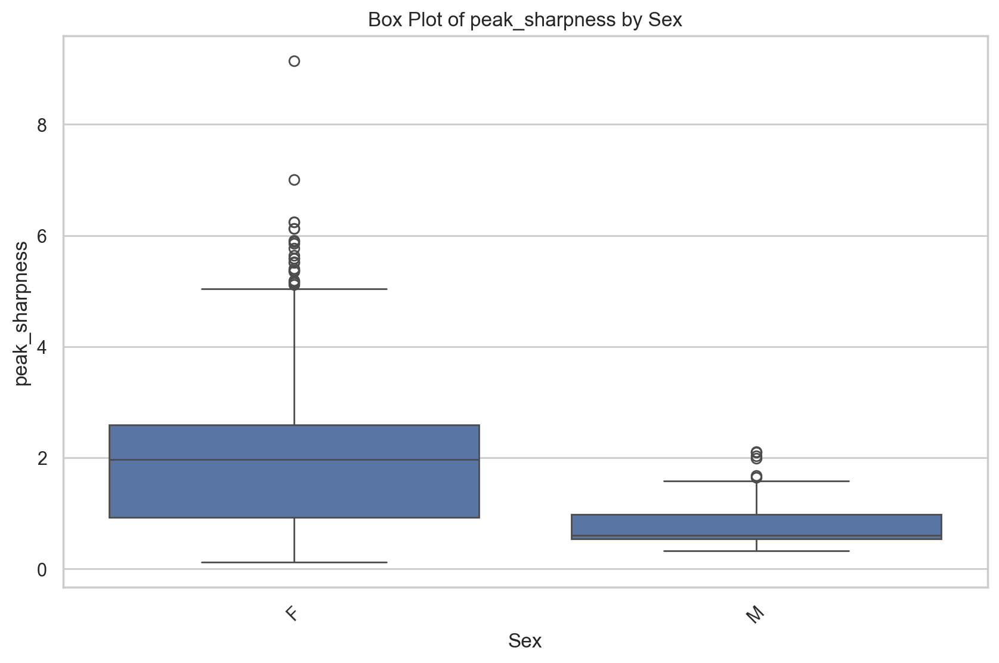

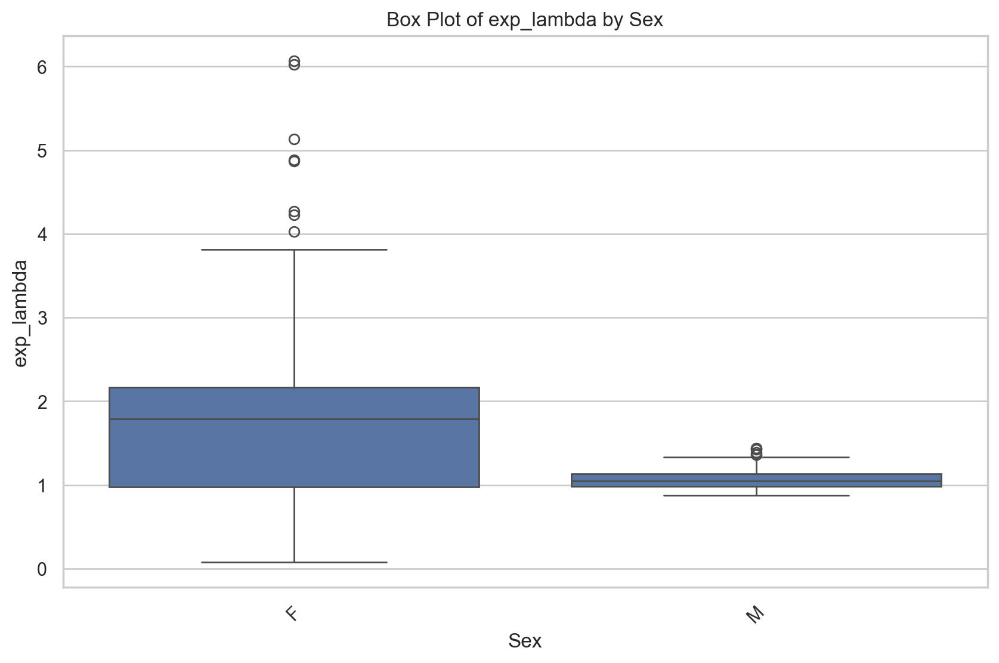

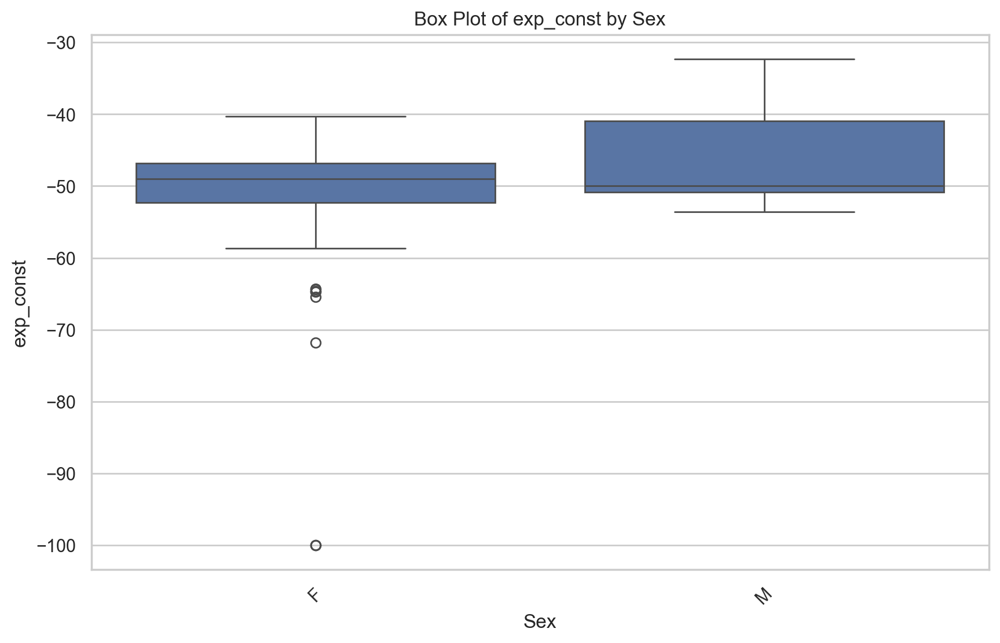

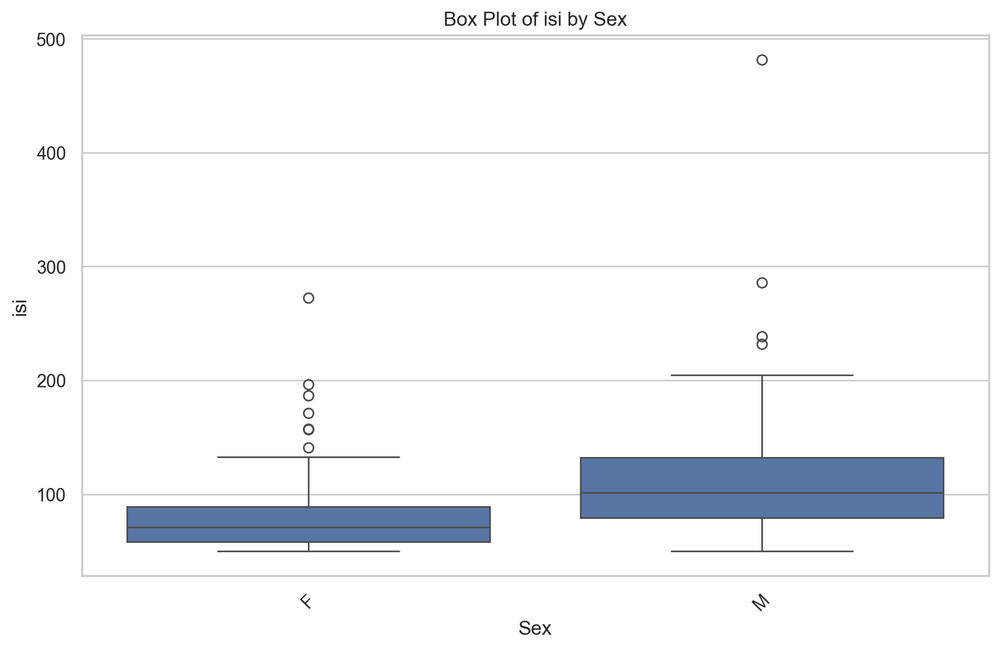

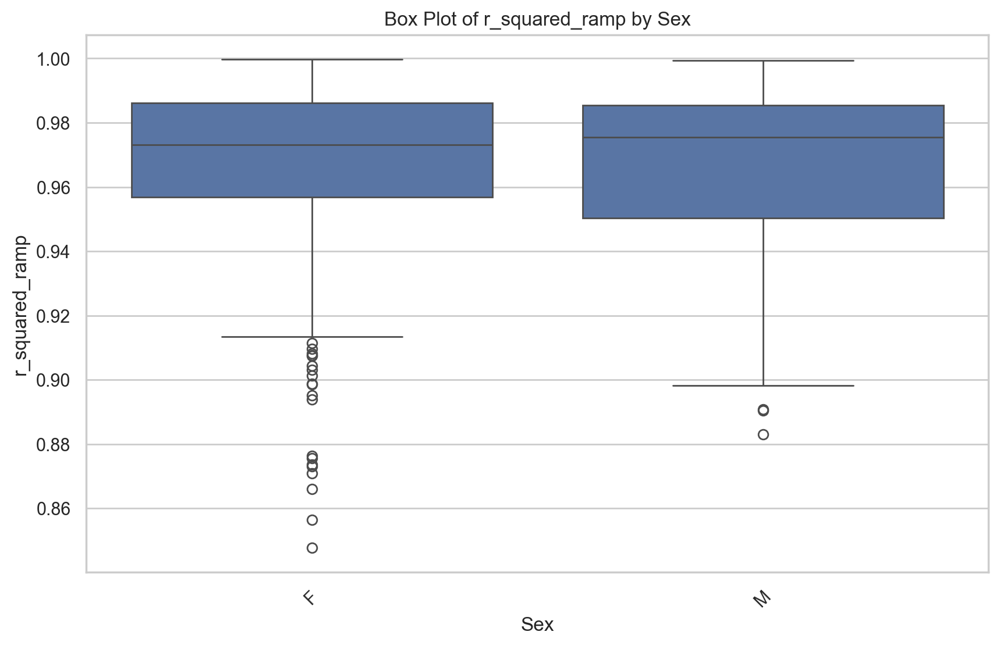

In [45]:
for sub_df in sub_dfs:
    # Find the varying metadata column (or None if not found)
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue  # Skip this group if no varying metadata is found

    # Call the function with the identified metadata parameter
    plot_waveform(sub_df, combined_dict_filt, metadata_param=varying_metadata, median=False, Overlapped=True)
    boxplots_byParam_byGroup(varying_metadata, sub_df)


## Stats by Group

In [46]:
index = 0
for sub_df in sub_dfs:
    print(index)
    index +=1
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue

    print_ANOVA(sub_df, varying_metadata)


0
ANOVA results for ramp_amp:
  Condition: dendriticType, F-value: 21.405863567947684, p-value: 6.4656073931e-06
ANOVA results for inflection_time:
  Condition: dendriticType, F-value: 184.11462858587439, p-value: 1.3332379039e-30
ANOVA results for inflection_amp:
  Condition: dendriticType, F-value: 108.84100261340984, p-value: 7.8345963722e-21
ANOVA results for peak_amp:
  Condition: dendriticType, F-value: 17.89736298713193, p-value: 3.4692281545e-05
ANOVA results for peak_width:
  Condition: dendriticType, F-value: 362.84105546871575, p-value: 8.2515323620e-48
ANOVA results for peak_sharpness:
  Condition: dendriticType, F-value: 190.61117270882528, p-value: 2.3556130127e-31
ANOVA results for exp_lambda:
  Condition: dendriticType, F-value: 707.8448293026958, p-value: 1.7076513831e-69
ANOVA results for exp_const:
  Condition: dendriticType, F-value: 329.1778853584202, p-value: 5.0405061860e-45
ANOVA results for isi:
  Condition: dendriticType, F-value: nan, p-value: nan
ANOVA resul

C:\Users\david\AppData\Local\Temp\ipykernel_33164\1806311567.py:18: DegenerateDataWarning: at least one input has length 0
  anova_results[feature][condition] = scipy.stats.f_oneway(*groups)


In [47]:
for sub_df in sub_dfs:
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue
    print(varying_metadata)
    print_PostHoc(sub_df, varying_metadata)


dendriticType
Tukey's test results for ramp_amp:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     A      S   -1.091   0.0 -1.5558 -0.6261   True
---------------------------------------------------


Tukey's test results for inflection_time:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  reject
-------------------------------------------------
     A      S   0.2367   0.0 0.2023 0.2711   True
-------------------------------------------------


Tukey's test results for inflection_amp:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     A      S  -4.7178   0.0 -5.6092 -3.8264   True
---------------------------------------------------


Tukey's test results for peak_amp:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
gro